In [68]:
!pip install basemap

In [69]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
import numpy as np
plt.style.use('fivethirtyeight')
import plotly.offline as py
from plotly.subplots import make_subplots
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls
from mpl_toolkits.basemap import Basemap
import folium
import folium.plugins
from matplotlib import animation,rc
import io
import base64
from IPython.display import HTML, display
import warnings
warnings.filterwarnings('ignore')
from matplotlib.pyplot import imread
import codecs
from subprocess import check_output
# print(check_output(["ls", "../input"]).decode("utf8"))
import plotly.express as px
import nltk
from wordcloud import WordCloud, STOPWORDS
import plotly.io as pio
import random
pio.renderers.default = 'notebook'
# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))


/kaggle/input/d/ssrockss/world-war-of-history-and-demographics/populations_clean.csv
/kaggle/input/d/ssrockss/world-war-of-history-and-demographics/countries_areas.csv
/kaggle/input/d/ssrockss/world-war-of-history-and-demographics/battles_clean.csv


In [70]:
battles = pd.read_csv('/kaggle/input/d/ssrockss/world-war-of-history-and-demographics/battles_clean.csv')
countries = pd.read_csv('/kaggle/input/d/ssrockss/world-war-of-history-and-demographics/countries_areas.csv')
populations = pd.read_csv('/kaggle/input/d/ssrockss/world-war-of-history-and-demographics/populations_clean.csv', encoding = 'latin-1')

In [71]:
populations.columns

Index(['Unnamed: 0', 'area', 'code', 'year', 'pop_estimate'], dtype='object')

In [102]:
countries.columns

Index(['area', 'region', 'area_km2'], dtype='object')

In [73]:
battles.columns

Index(['Unnamed: 0', 'id', 'war', 'area', 'year', 'duration', 'LZ_scale',
       'participants', 'winner', 'loser', 'latitude', 'longitude'],
      dtype='object')

In [74]:
populations.head()

,Unnamed: 0,area,code,year,pop_estimate
0,0,afghanistan,AFG,-10000,14737
1,1,afghanistan,AFG,-9000,20405
2,2,afghanistan,AFG,-8000,28253
3,3,afghanistan,AFG,-7000,39120
4,4,afghanistan,AFG,-6000,54166


In [75]:
battles.head()

,Unnamed: 0,id,war,area,year,duration,LZ_scale,participants,winner,loser,latitude,longitude
0,1,Aachen1944,World War II,germany,1944,1.0,3,"['American', 'German', 'Hurtgen']",United States,Germany,50.775346,6.083887
1,3,Aardenburg1672,3rd Dutch War,netherlands,1672,1.0,-1,"['Spanish', 'Netherlands', 'French', 'Dutch', ...",Netherlands,France,51.274273,3.445333
2,5,Aa River1917,World War I,latvia,1917,1.0,4,"['German', 'Russian', 'Riga', 'Germans']",Germany,Russia,56.820699,23.575501
3,7,Aasle1389,Wars of Scandinavian Union,sweden,1389,1.0,-1,"['Denmark', 'Sweden', 'Aasle', 'Falkoping', 'S...",Denmark,Sweden,58.177535,13.686934
4,9,Abadan1980,Iraq-Iran War,iran,1980,1.0,3,"['Khorramshahr', 'Iraqi', 'Arab', 'Iran', 'Ira...",Draw,Draw,30.347296,48.293400


In [76]:
countries.columns

Index(['Unnamed: 0', 'area', 'region', 'area_km2'], dtype='object')

In [77]:
populations.columns

Index(['Unnamed: 0', 'area', 'code', 'year', 'pop_estimate'], dtype='object')

In [78]:
battles = battles.drop('Unnamed: 0', axis=1)

# Overview

## Get the top populated areas in a specific year


In [79]:
# Merge population data with countries to get the region for each area
pop_countries = populations.merge(countries, on='area')

# For each region and year, find the area with the highest population
most_populated = pop_countries.loc[pop_countries.groupby(['region', 'year'])['pop_estimate'].idxmax()]

# Create an interactive line graph using Plotly
fig = px.line(most_populated, x='year', y='pop_estimate', color='region',
              hover_name='area', hover_data=['region'],
              title='Most Populated Regions in Each Region Over Time',
              labels={'year': 'Year', 'pop_estimate': 'Population Estimate', 'region': 'Region'})

# Customize hover information
fig.update_traces(mode='lines+markers', hovertemplate='<b>Area:</b> %{hovertext}<br><b>Population:</b> %{y}<br><b>Year:</b> %{x}')

# Show the plot
fig.show()

## Population growth over time

In [80]:
fig = px.line(populations, x='year', y='pop_estimate', color='area',
              title='Population Growth Over Time by Area',
              labels={'year': 'Year', 'pop_estimate': 'Population Estimate', 'area': 'Area'},
              hover_data=['area', 'pop_estimate'])

# Update layout for better readability and custom zoom
fig.update_layout(
    xaxis_title='Year',
    yaxis_title='Population Estimate',
    legend_title='Area',
    font=dict(size=16),
    hovermode='closest',
    xaxis=dict(
        range=[0, 2020]  # Adjust this range to zoom into specific years
    ),
    yaxis=dict(
        range=[0, 5e9]  # Adjust this range to zoom into specific population values
    )
)

# Show the plot
fig.show()

## Battle Locations on a World Map

In [81]:
fig = px.scatter_geo(battles, lat='latitude', lon='longitude', 
                     hover_name='war', hover_data=['year', 'winner', 'loser', 'duration'],
                     title='Battle Locations Across the World')

fig.update_layout(template='plotly_dark')
fig.show()

## winners on each region of war on world map

In [82]:
battles_countries_df = pd.merge(battles, countries, on='area')

# Create a dataframe for visualization without grouping
geo = pd.DataFrame({
    'Country': battles_countries_df['area'],
    'Winner': battles_countries_df['winner'],
    'Battle_Duration': battles_countries_df['duration']
})

# Create a choropleth map or scatter map for each battle without grouping
fig = px.choropleth(geo, 
                    locations="Country", 
                    locationmode="country names", 
                    color="Battle_Duration", 
                    hover_name="Country", 
                    hover_data=['Winner', 'Battle_Duration'],
                    range_color=[geo['Battle_Duration'].min(), geo['Battle_Duration'].max()],
                    color_continuous_scale='Viridis',  # Change color scale if needed
                    title='Battle Duration by Country and Winner')

# Update layout for better visibility
fig.update(layout_coloraxis_showscale=True)
fig.update_layout(template='plotly_dark')

# Show the plot
fig.show()


## Battle Intensity by Region (Heatmap)


In [83]:
from folium.plugins import HeatMap

# Merging the countries and battles data on 'area'
merged_data = pd.merge(battles, countries, on='area')

# Step 2: Group data by 'region' and calculate average battle duration and LZ_scale
region_battles = merged_data.groupby(['regon', 'latitude', 'longitude']).agg(
    avg_duration=('duration', 'mean'),
    avg_LZ_scale=('LZ_scale', 'mean')
).reset_index()

# Sort the data by LZ_scale to get the top regions with the highest intensity
region_battles_sorted = region_battles.sort_values(by='avg_LZ_scale', ascending=False)

# Step 3: Prepare data for HeatMap (latitudes, longitudes, and the intensity by LZ_scale)
heatmap_data = region_battles_sorted[['latitude', 'longitude', 'avg_LZ_scale']].values.tolist()

# Step 4: Visualizing on World Map using Folium HeatMap
basemap = folium.Map(location=[20, 0], zoom_start=2)  # Center the map

# Add heatmap layer to the map using LZ_scale as intensity
HeatMap(heatmap_data, radius=15, blur=10, max_zoom=1).add_to(basemap)

# Display the map
basemap

## timely trend of population growth with time

## Correlation

In [84]:
numeric_columns = battles.select_dtypes(include=[np.number]).columns
correlation_matrix = battles[numeric_columns].corr()

# Create the heatmap trace
trace = go.Heatmap(z=correlation_matrix.values,
                   x=correlation_matrix.columns,
                   y=correlation_matrix.columns)

# Create the layout
layout = go.Layout(
    title='Correlation Matrix',
    template='plotly_dark'
)

# Create the figure
fig = go.Figure(data=[trace], layout=layout)
fig.show()

In [85]:
countries = countries.drop('Unnamed: 0', axis=1)

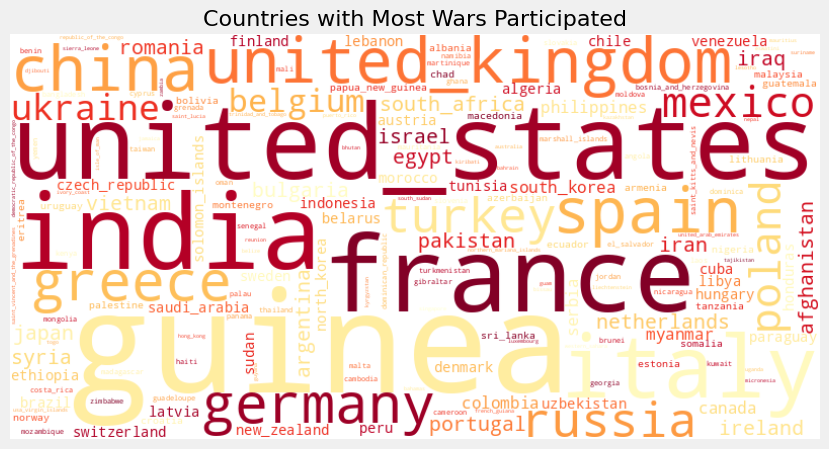

In [86]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Count the number of wars for each country
war_counts = battles['area'].value_counts()

# Create a dictionary of country names and their war counts
country_war_dict = war_counts.to_dict()

# Generate text for word cloud
# Repeat each country name based on the war count
text = ' '.join([country + ' ' * count for country, count in country_war_dict.items()])

# Create and generate a word cloud image
wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='YlOrRd').generate(text)

# Display the generated word cloud image
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Countries with Most Wars Participated', fontsize=16)
plt.show()


In [87]:
# import pandas as pd
# import plotly.graph_objects as go
# from plotly.subplots import make_subplots
# import plotly.express as px
battle_count = battles.groupby(['area', 'year']).size().reset_index(name='battle_count')

# Merge battles with countries to get region information
battles_with_region = pd.merge(battles, countries[['area', 'region']], on='area')

# Count battles per region
battles_per_region = battles_with_region.groupby('region').size().reset_index(name='battle_count')

# Merge with populations data
merged_data = pd.merge(populations, battles[['area', 'year', 'latitude', 'longitude']], on=['area', 'year'], how='left')
merged_data = pd.merge(merged_data, battle_count, on=['area', 'year'], how='left')
merged_data['battle_count'].fillna(0, inplace=True)

# Create figure with subplots
fig = make_subplots(rows=1, cols=1, specs=[[{"type": "scattergeo"}]])

# Add base map
fig.add_trace(go.Scattergeo())

# Create frames for animation
frames = []
for year in sorted(merged_data['year'].unique()):
    year_data = merged_data[merged_data['year'] == year]
    
    frame = go.Frame(
        data=[go.Scattergeo(
            lon=year_data['longitude'],
            lat=year_data['latitude'],
            text=year_data.apply(
                lambda row: f"Area: {row['area']}<br>Population: {row['pop_estimate']:,.0f}<br>Battles: {row['battle_count']:.0f}", axis=1
            ),
            mode='markers',
            marker=dict(
                size=year_data['pop_estimate'].apply(lambda x: min(max(x * 1e-6, 2), 20)),
                color=year_data['battle_count'],
                colorscale='YlOrRd',  # Enhanced color scale for better visibility
                showscale=True,
                colorbar=dict(
                    title='Battle Count',
                    thickness=15,
                    tickvals=[0, year_data['battle_count'].quantile(0.5), year_data['battle_count'].max()],
                    ticktext=['Low', 'Medium', 'High']
                ),
                cmin=0,
                cmax=year_data['battle_count'].max()
            )
        )],
        name=str(year)
    )
    frames.append(frame)

# Add frames to the figure
fig.frames = frames

# Configure animation settings
fig.update_layout(
    updatemenus=[{
        'buttons': [
            {
                'args': [None, {'frame': {'duration': 500, 'redraw': True}, 'fromcurrent': True}],
                'label': 'Play',
                'method': 'animate'
            },
            {
                'args': [[None], {'frame': {'duration': 0, 'redraw': True}, 'mode': 'immediate', 'transition': {'duration': 0}}],
                'label': 'Pause',
                'method': 'animate'
            }
        ],
        'direction': 'left',
        'pad': {'r': 10, 't': 87},
        'showactive': False,
        'type': 'buttons',
        'x': 0.1,
        'xanchor': 'right',
        'y': 0,
        'yanchor': 'top'
    }],
    sliders=[{
        'active': 0,
        'yanchor': 'top',
        'xanchor': 'left',
        'currentvalue': {
            'font': {'size': 20},
            'prefix': 'Year: ',
            'visible': True,
            'xanchor': 'right'
        },
        'transition': {'duration': 300, 'easing': 'cubic-in-out'},
        'pad': {'b': 10, 't': 50},
        'len': 0.9,
        'x': 0.1,
        'y': 0,
        'steps': [{'args': [[f.name], {'frame': {'duration': 300, 'redraw': True}, 'mode': 'immediate', 'transition': {'duration': 300}}], 'label': f.name, 'method': 'animate'} for f in frames]
    }],
    title='Population and Battles Over Time',
    geo=dict(
        showland=True,
        showcountries=True,
        showocean=True,
        countrywidth=0.5,
        landcolor='rgb(243, 243, 243)',
        oceancolor='rgb(204, 229, 255)',
        projection_type='natural earth'
    )
)

# Show the figure
fig.show()


In [88]:
battles

,id,war,area,year,duration,LZ_scale,participants,winner,loser,latitude,longitude
0,Aachen1944,World War II,germany,1944,1.0,3,"['American', 'German', 'Hurtgen']",United States,Germany,50.775346,6.083887
1,Aardenburg1672,3rd Dutch War,netherlands,1672,1.0,-1,"['Spanish', 'Netherlands', 'French', 'Dutch', ...",Netherlands,France,51.274273,3.445333
2,Aa River1917,World War I,latvia,1917,1.0,4,"['German', 'Russian', 'Riga', 'Germans']",Germany,Russia,56.820699,23.575501
3,Aasle1389,Wars of Scandinavian Union,sweden,1389,1.0,-1,"['Denmark', 'Sweden', 'Aasle', 'Falkoping', 'S...",Denmark,Sweden,58.177535,13.686934
4,Abadan1980,Iraq-Iran War,iran,1980,1.0,3,"['Khorramshahr', 'Iraqi', 'Arab', 'Iran', 'Ira...",Draw,Draw,30.347296,48.293400
...,...,...,...,...,...,...,...,...,...,...,...
8876,Zutphen1586,Netherlands War of Independence,netherlands,1586,1.0,-1,"['Antwerp', 'Netherlands', 'Arnhem', 'Spanish'...",Spain,England,52.142736,6.196058
8877,Zutphen1591,Netherlands War of Independence,netherlands,1591,1.0,-1,['France'],Netherlands,Spain,52.142736,6.196058
8878,Zuyder Zee1573,Netherlands War of Independence,netherlands,1573,1.0,-1,"['Spanish', 'Dutch', 'Spanish']",Netherlands,Spain,52.672456,4.831233
8879,Zuyper Sluys1799,French Revolutionary Wars (2nd Coalition),netherlands,1799,1.0,-1,"['French', 'Holland', 'Zuyper', 'Alkmaar', 'Fr...",United Kingdom,"France, Netherlands",52.672456,4.831233


In [89]:


# Color scale options for plotly graphs
my_list = ['Viridis', 'Cividis', 'Plasma', 'Turbo', 'Inferno']

# Define the bar plot function similar to your reference
def bar_plot(battles, countries, x='region', y='duration', Gtype='mean', seed=0):
    # Merging the countries and battles data on 'area'
    merged_data = pd.merge(battles, countries, on='area')
    
    # Grouping data based on Gtype
    if Gtype == 'mean':
        df = merged_data.groupby(x)[y].mean().reset_index()
    elif Gtype == 'sum':
        df = merged_data.groupby(x)[y].sum().reset_index()
    else:
        df = merged_data.groupby(x)[y].count().reset_index()
    
    # Sorting the data
    if seed == 0:
        df = df.sort_values(y, ascending=False)
    else:
        df = df.sort_values(y, ascending=False)[:seed]
    
    # Plotting using plotly.express
    fig = px.bar(df, x=x, y=y, title=f'{y} {Gtype} by {x}',
                 color=y, color_continuous_scale=random.choice(my_list), text_auto=True)
    
    # Update layout to match a dark theme
    fig.update_layout(template='plotly_dark')
    
    fig.show()

# Assuming battles and countries are DataFrames
# battles = pd.read_csv('battles.csv')
# countries = pd.read_csv('countries.csv')

# Example function call
bar_plot(battles, countries, x='region', y='duration', Gtype='mean', seed=0)


In [90]:
!pip install pandas folium geopandas

# Is there a correlation between battle duration and the number of participants?
Build upon the previous analysis by adding the number of participants, exploring if larger battles lasted longer, particularly in certain regions.

In [91]:
# Create an interactive scatter plot
fig = px.scatter(battles, x=battles['participants'].apply(lambda x: len(str(x).split(','))), 
                 y='duration', color='war',
                 hover_name='war', hover_data=['year', 'winner', 'loser'],
                 title='Number of Participants vs Battle Duration',
                 labels={'x': 'Number of Participants', 'duration': 'Battle Duration (days)'})

# Add interactivity
fig.update_traces(marker=dict(size=10, opacity=0.7),
                  selector=dict(mode='markers'))

# Show the plot
fig.show()

In [92]:
!pip install pandas numpy matplotlib seaborn scipy

In [93]:

# Merge battles with countries
battles_countries_df = pd.merge(battles, countries, on='area')

# Create a DataFrame for visualization
geo = pd.DataFrame({
    'Country': battles_countries_df['area'],
    'Winner': battles_countries_df['winner'],
    'Battle_Duration': battles_countries_df['duration']
})

# Define the range for color scaling, using a narrow range to highlight small variations
min_duration = geo['Battle_Duration'].min()
max_duration = geo['Battle_Duration'].quantile(0.99)  # Use 99th percentile to avoid extreme outliers

# Create a choropleth map with an enhanced color scale and narrow range
fig = px.choropleth(geo, 
                    locations="Country", 
                    locationmode="country names", 
                    color="Battle_Duration", 
                    hover_name="Country", 
                    hover_data=['Winner', 'Battle_Duration'],
                    range_color=[min_duration, max_duration],  # Narrower color range
                    color_continuous_scale='YlOrRd',  # A color scale with pronounced gradients
                    title='Battle Duration by Country and Winner')

# Update layout for better visibility
fig.update_layout(
    coloraxis_colorbar=dict(
        title="Battle Duration",
        tickvals=[min_duration, geo['Battle_Duration'].median(), max_duration],
        ticktext=['Low', 'Medium', 'High']
    ),
    template='plotly_dark'
)

# Show the plot
fig.show()


# battle trends

In [94]:
battles_per_year = battles.groupby('year').size().reset_index(name='battle_count')

# Create a line plot using Plotly
fig = go.Figure()

# Add line trace to the figure
fig.add_trace(go.Scatter(x=battles_per_year['year'], 
                         y=battles_per_year['battle_count'], 
                         mode='lines+markers',
                         line=dict(color='blue'),
                         marker=dict(size=8),
                         name='Battle Count'))

# Add title and labels
fig.update_layout(title='Trend of Battles Over Time',
                  xaxis_title='Year',
                  yaxis_title='Number of Battles',
                  template='plotly_white')

# Show the plot
fig.show()

## Number of participants vs Battle durations

In [95]:
# Sample a smaller dataset for faster plotting
sampled_battles = battles.sample(n=8000, random_state=42)  # Adjust sample size as needed

# Sort the dataset by the number of participants (or any other logical order, e.g., year)
sampled_battles = sampled_battles.sort_values(by='participants')

# Create a line plot of Participants vs Duration using Plotly
fig = px.line(sampled_battles, 
              x='participants', 
              y='duration', 
              hover_data=['war', 'year', 'winner', 'loser'],
              title='Participants vs Battle Duration (Sampled Data)')

# Customize layout
fig.update_layout(template='plotly_dark', 
                  xaxis_title="Number of Participants", 
                  yaxis_title="Battle Duration (Days)")

# Show the plot
fig.show()

# Searches

## Reigion wise participation in the battles

In [96]:


# Merge battles with countries to get region information
battles_with_region = pd.merge(battles, countries[['area', 'region']], on='area')

# Count battles per region
battles_per_region = battles_with_region.groupby('region').size().reset_index(name='battle_count')

# Get the top 7 regions by number of battles
top_10_regions = battles_per_region.nlargest(7, 'battle_count')

# Combine the rest into a single 'Others' category
other_regions = battles_per_region[~battles_per_region['region'].isin(top_10_regions['region'])]
other_regions = pd.DataFrame({'region': ['Others'], 'battle_count': [other_regions['battle_count'].sum()]})

# Append the 'Others' category to the top 7 regions
final_data = pd.concat([top_10_regions, other_regions], ignore_index=True)

# Create a pie chart for the top 7 regions and 'Others'
fig = px.pie(final_data, 
             names='region', 
             values='battle_count',
             title='Top 7 Regions by Battle Participation (Others Combined)',
             labels={'battle_count': 'Number of Battles', 'region': 'Region'})

fig.show()


## Top 10 country participation in battles

In [97]:
battles_per_area = battles.groupby('area').size().reset_index(name='battle_count')

# Get the top 5 areas by number of battles
top_areas = battles_per_area.nlargest(10, 'battle_count')

# Combine the rest into a single category
other_areas = battles_per_area[~battles_per_area['area'].isin(top_areas['area'])]
other_areas = pd.DataFrame({'area': ['Other'], 'battle_count': [other_areas['battle_count'].sum()]})

# Append the 'Other' category to the top areas
final_data = pd.concat([top_areas, other_areas], ignore_index=True)

# Create a pie chart for the top 10 areas and 'Other' category
fig = px.pie(final_data, 
             names='area', 
             values='battle_count',
             title='Top 10 Areas by Battle Participation (Others Combined)',
             labels={'battle_count': 'Number of Battles', 'area': 'Area'})

fig.show()


In [103]:
battles.shape

(8881, 11)